[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv12 Object Detection on a Custom Dataset

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

## Environment setup

### Configure your API keys

To fine-tune YOLOv12, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [4]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

SecretNotFoundError: Secret ROBOFLOW_API_KEY does not exist.

### Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [5]:
!nvidia-smi

Sat Mar  1 09:28:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


### Install dependencies

**NOTE:** Currently, YOLOv12 does not have its own PyPI package, so we install it directly from GitHub while also adding roboflow (to conveniently pull datasets from the Roboflow Universe), supervision (to visualize inference results and benchmark the model’s performance), and flash-attn (to accelerate attention-based computations via optimized CUDA kernels).

In [7]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 66.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

### Download example data

Let's download an image we can use for YOLOv12 inference. Feel free to drag and drop your own images into the Files tab on the left-hand side of Google Colab, then reference their filenames in your code for a custom inference demo.

In [8]:
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

--2025-03-01 09:32:22--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.001s  

2025-03-01 09:32:22 (106 MB/s) - ‘dog.jpeg’ saved [106055/106055]



## Run inference

In the example, we're using the `yolov12l.pt` model, but you can experiment with different model sizes by simply swapping out the model name during initialization. Options include `yolov12n.pt`, `yolov12s.pt`, `yolov12m.pt`, `yolov12l.pt`, and `yolov12x.pt`.

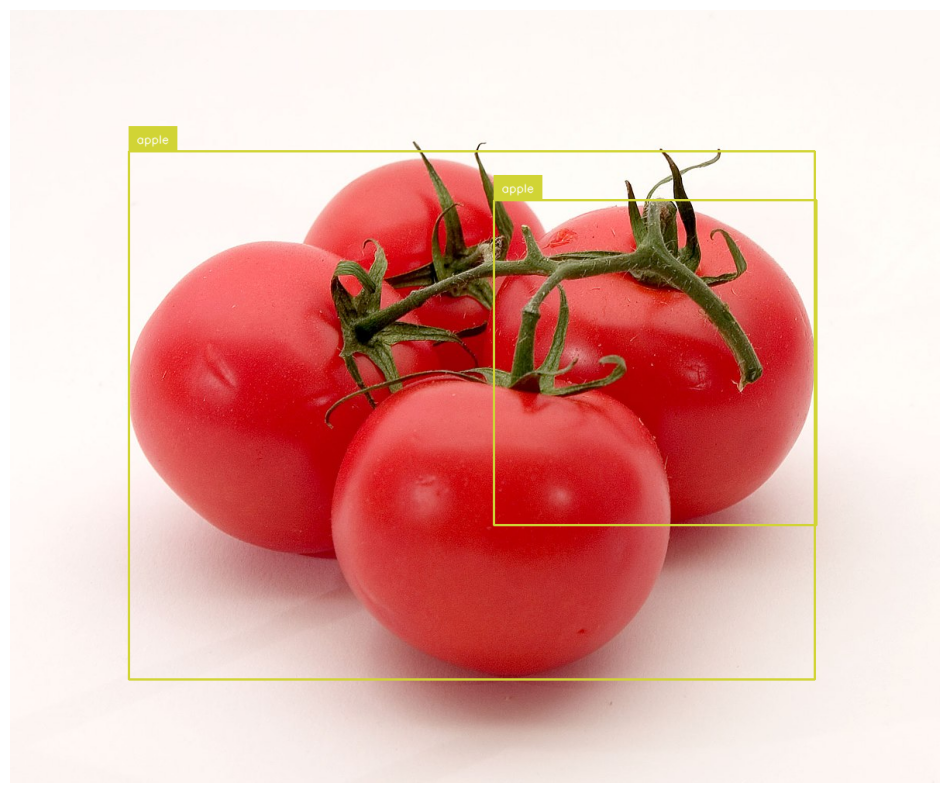

In [11]:
import cv2
from ultralytics import YOLO
import supervision as sv


image_path = f"/content/drive/MyDrive/tomatodata/working/test/images/riped_tomato_16.jpeg"
image = cv2.imread(image_path)

model = YOLO('yolov12l.pt')

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

## Download dataset from Roboflow Universe

In [ ]:
from roboflow import download_dataset

dataset = download_dataset('https://universe.roboflow.com/roboflow-100/circuit-voltages/dataset/2', 'yolov8')

In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

names:
- GND
- IDC
- IDC_I
- R
- VDC
- VDC_I
nc: 6
roboflow:
  license: CC BY 4.0
  project: circuit-voltages
  url: https://universe.roboflow.com/roboflow-100/circuit-voltages/dataset/2
  version: 2
test: ../test/images
train: ../train/images
val: ../valid/images


## Fine-tune YOLOv12 model

We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12s.yaml`, but you can replace it with any other model (e.g., `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) based on your preference. We set the training to run for 100 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

In [12]:
# Define base path for the dataset
base_data_dir = os.path.join("/content/drive/MyDrive/tomatodata/Riped and Unriped Tomato Dataset")
print(f"Base Data Directory: {base_data_dir}")

Base Data Directory: /content/drive/MyDrive/tomatodata/Riped and Unriped Tomato Dataset


Base Data Directory: /content/drive/MyDrive/tomatodata/Riped and Unriped Tomato Dataset


In [14]:
# Define specific paths for images and labels
images_dir = os.path.join(base_data_dir, "Images")
labels_dir = os.path.join(base_data_dir, "labels")

print(f"Images Dir: {images_dir}, Labels Dir: {labels_dir}")

Images Dir: /content/drive/MyDrive/tomatodata/Riped and Unriped Tomato Dataset/Images, Labels Dir: /content/drive/MyDrive/tomatodata/Riped and Unriped Tomato Dataset/labels


## Evaluate fine-tuned YOLOv12 model

In [16]:
def load_data(images_dir, labels_dir):
    images = []
    annotations = []

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg'):
            image_path = os.path.join(images_dir, filename)
            annotation_path = os.path.join(labels_dir, filename.replace('.jpeg', '.txt'))

            if os.path.exists(annotation_path):
                images.append(image_path)
                annotations.append(annotation_path)

    return images, annotations

In [26]:
from ultralytics import YOLO

model = YOLO('yolov12s.yaml')

results = model.train(data=f'/content/drive/MyDrive/tomatodata/working/dataset.yaml', epochs=500)

New https://pypi.org/project/ultralytics/8.3.81 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov12s.yaml, data=/content/drive/MyDrive/tomatodata/working/dataset.yaml, epochs=500, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embe

train: Scanning /content/drive/MyDrive/tomatodata/working/train/labels.cache... 141 images, 0 backgrounds, 0 corrupt: 100%|██████████| 141/141 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/tomatodata/working/test/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      5.02G      3.113      3.865       4.22        118        640: 100%|██████████| 9/9 [00:04<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         36        205    0.00599      0.347    0.00621    0.00203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      4.78G       3.05      3.825      4.206        120        640: 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         36        205    0.00605      0.352    0.00654    0.00233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      4.85G      3.174      3.748      4.142        155        640: 100%|██████████| 9/9 [00:04<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         36        205    0.00631      0.365    0.00588    0.00195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500      4.88G      3.034      3.557       4.07        101        640: 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]

                   all         36        205    0.00968      0.403    0.00838    0.00313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      4.87G      2.918      3.322      3.914        108        640: 100%|██████████| 9/9 [00:03<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         36        205     0.0096      0.407    0.00922    0.00316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500      4.84G      2.887      3.101      3.785         92        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         36        205    0.00996      0.431      0.015    0.00426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      4.88G      2.944      2.895      3.665        115        640: 100%|██████████| 9/9 [00:03<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         36        205     0.0105      0.461     0.0228    0.00955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      4.87G      2.841      2.801      3.537        131        640: 100%|██████████| 9/9 [00:04<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         36        205    0.00976      0.487     0.0365     0.0143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      4.88G      2.829       2.77      3.434        186        640: 100%|██████████| 9/9 [00:03<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         36        205    0.00839      0.444     0.0875     0.0278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      4.83G      2.824      2.823      3.422        157        640: 100%|██████████| 9/9 [00:03<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         36        205     0.0124        0.6     0.0213    0.00626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      4.89G      2.665      2.677      3.314         94        640: 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.78it/s]

                   all         36        205      0.525     0.0726     0.0266    0.00714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      4.84G       2.75      2.562      3.175        108        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         36        205    0.00979      0.401      0.022     0.0094



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      4.87G      2.622      2.579      3.132        141        640: 100%|██████████| 9/9 [00:05<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         36        205      0.579     0.0556     0.0608     0.0159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      4.85G      2.653       2.53      3.122         95        640: 100%|██████████| 9/9 [00:05<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         36        205      0.518      0.265      0.119     0.0369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      4.87G      2.612       2.46      3.085         82        640: 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]


                   all         36        205     0.0605      0.304     0.0462     0.0179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      4.87G      2.554      2.405      3.036        125        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         36        205     0.0856      0.314     0.0732     0.0305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      4.87G      2.478       2.34      2.964        121        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]


                   all         36        205       0.31      0.314      0.226     0.0859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/500      4.89G       2.47      2.376      2.971        116        640: 100%|██████████| 9/9 [00:05<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.72it/s]

                   all         36        205      0.323      0.353      0.291      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      4.85G      2.384      2.223      2.862        128        640: 100%|██████████| 9/9 [00:04<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         36        205        0.3      0.316      0.224     0.0765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      4.88G      2.449      2.337      2.894        121        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.67it/s]

                   all         36        205      0.163       0.23      0.109     0.0325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      4.87G       2.35      2.241      2.787        141        640: 100%|██████████| 9/9 [00:04<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         36        205      0.104      0.287      0.111     0.0453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      4.89G      2.342      2.196       2.78        137        640: 100%|██████████| 9/9 [00:04<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]


                   all         36        205      0.261      0.185      0.154     0.0622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      4.84G      2.284      2.178      2.755        118        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         36        205      0.181      0.235      0.158     0.0649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      4.89G      2.261      2.085      2.681         99        640: 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         36        205      0.297      0.294      0.214     0.0942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      4.82G      2.237      2.079      2.645        179        640: 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.76it/s]

                   all         36        205      0.407      0.473      0.385       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      4.87G      2.138      1.987      2.573        143        640: 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         36        205      0.484      0.418      0.416      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      4.86G      2.166      2.021      2.566        151        640: 100%|██████████| 9/9 [00:05<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         36        205      0.563      0.502       0.52      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      4.84G      2.077       1.96      2.562        112        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         36        205      0.493      0.381      0.421      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      4.87G      2.115      1.881      2.546         99        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.23it/s]

                   all         36        205      0.629      0.495      0.543      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      4.84G      1.973      1.839      2.438         97        640: 100%|██████████| 9/9 [00:06<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.50it/s]

                   all         36        205      0.586      0.506      0.527      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      4.88G      2.027      1.823      2.463        115        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         36        205      0.557      0.583      0.575      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      4.88G      1.979      1.757      2.424        120        640: 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.92it/s]

                   all         36        205      0.544      0.593      0.575      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      4.86G      1.972      1.753      2.412         97        640: 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         36        205      0.656      0.518      0.606      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      4.71G      2.013      1.755      2.439         91        640: 100%|██████████| 9/9 [00:04<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.71it/s]

                   all         36        205      0.759      0.491      0.607      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      4.83G      1.945      1.717      2.379        156        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         36        205      0.652      0.495      0.544      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      4.86G      1.904      1.706      2.321         85        640: 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.75it/s]

                   all         36        205      0.603      0.518      0.561      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      4.84G      1.903      1.772      2.319        123        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         36        205      0.665      0.538       0.58       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      4.85G      1.863      1.662        2.3        118        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.75it/s]

                   all         36        205       0.71      0.487      0.547      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      4.88G      1.892      1.676      2.311        140        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]

                   all         36        205      0.833      0.424      0.561      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      4.89G      1.807      1.597      2.244         68        640: 100%|██████████| 9/9 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all         36        205      0.663      0.597      0.652      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      4.88G      1.856      1.658      2.292        132        640: 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         36        205      0.666      0.631      0.667      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      4.87G      1.844      1.569      2.227        152        640: 100%|██████████| 9/9 [00:03<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         36        205      0.714      0.585      0.616      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      4.88G      1.849      1.632      2.274         92        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         36        205      0.656      0.596      0.609      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500      4.86G      1.807      1.559      2.212        113        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]


                   all         36        205      0.792      0.592      0.699      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500      4.85G      1.822      1.542      2.259         95        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]


                   all         36        205       0.75      0.606      0.664       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      4.89G      1.751      1.495      2.173        126        640: 100%|██████████| 9/9 [00:04<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         36        205      0.772      0.578      0.691      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      4.85G      1.831      1.514      2.222         97        640: 100%|██████████| 9/9 [00:04<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         36        205      0.795      0.588      0.699      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      4.88G       1.76      1.483      2.165        133        640: 100%|██████████| 9/9 [00:04<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.06it/s]

                   all         36        205      0.823      0.562      0.694       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500      4.86G      1.737      1.447      2.156        117        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         36        205      0.703       0.57      0.639      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      4.84G      1.785      1.434      2.136        132        640: 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]

                   all         36        205      0.732      0.676      0.692      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500      4.87G      1.699      1.401      2.075        131        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         36        205      0.734        0.7       0.73       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      4.89G      1.698      1.382      2.118        120        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         36        205      0.804      0.582      0.696      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      4.88G      1.704      1.376      2.085        116        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.21it/s]

                   all         36        205       0.73       0.66      0.728      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      4.88G       1.67      1.355       2.06        119        640: 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         36        205      0.757      0.726      0.762      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500      4.84G      1.662      1.357      2.063        155        640: 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]

                   all         36        205      0.768      0.764      0.781      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      4.84G       1.63       1.31      2.062        150        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         36        205      0.785      0.686      0.765       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500      4.85G      1.653      1.324       2.06        190        640: 100%|██████████| 9/9 [00:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         36        205      0.761       0.77      0.785      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      4.88G      1.647      1.334      2.055        152        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]


                   all         36        205      0.789      0.662       0.74      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      4.89G       1.68      1.365       2.08        106        640: 100%|██████████| 9/9 [00:04<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all         36        205      0.728      0.659      0.745      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      4.87G       1.59      1.303       2.02        130        640: 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.85it/s]

                   all         36        205      0.758      0.726      0.781      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      4.88G       1.59      1.209      1.985        109        640: 100%|██████████| 9/9 [00:03<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all         36        205      0.799      0.719      0.765      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      4.87G      1.577      1.256       1.96        101        640: 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         36        205      0.799      0.617      0.731       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      4.84G      1.554      1.247      1.974        132        640: 100%|██████████| 9/9 [00:03<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all         36        205      0.806      0.666      0.768      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      4.89G      1.595      1.258      1.994        154        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         36        205      0.766      0.684      0.746      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500      4.85G      1.616      1.278      1.999        155        640: 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         36        205      0.694      0.613      0.662      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      4.84G       1.52      1.226      1.935        115        640: 100%|██████████| 9/9 [00:04<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         36        205      0.807      0.741      0.788      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      4.88G      1.564      1.242      1.932        143        640: 100%|██████████| 9/9 [00:05<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         36        205      0.791      0.745      0.791      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500      4.87G      1.592      1.231       1.98        112        640: 100%|██████████| 9/9 [00:05<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         36        205      0.693      0.625      0.635      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      4.85G      1.518      1.173       1.95         88        640: 100%|██████████| 9/9 [00:05<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         36        205      0.687      0.642      0.673      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      4.86G      1.474      1.146      1.909         97        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         36        205      0.824      0.731      0.795      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      4.87G       1.52       1.14      1.888        135        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         36        205      0.844      0.745      0.804      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      4.85G      1.507      1.123      1.905        113        640: 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]

                   all         36        205       0.79      0.674       0.77      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      4.88G      1.518      1.112      1.908         92        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         36        205      0.816      0.691      0.795      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      4.87G      1.517      1.164      1.929         86        640: 100%|██████████| 9/9 [00:05<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         36        205      0.792      0.634      0.754      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      4.88G      1.483      1.115      1.876        106        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         36        205      0.806       0.67      0.763      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      4.88G      1.513      1.163      1.919        130        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         36        205      0.793       0.74      0.821      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      4.85G      1.423      1.058      1.825        126        640: 100%|██████████| 9/9 [00:05<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         36        205      0.808      0.757      0.801      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      4.84G      1.488      1.114      1.871        114        640: 100%|██████████| 9/9 [00:03<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

                   all         36        205      0.785      0.759      0.797      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500      4.87G      1.457       1.06       1.83        154        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all         36        205       0.74      0.776      0.797      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500      4.84G      1.509      1.095      1.915         93        640: 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.99it/s]

                   all         36        205      0.751      0.757      0.784      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      4.87G      1.474      1.063      1.848        118        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         36        205       0.73      0.739      0.722      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500       4.9G      1.496      1.115      1.871        128        640: 100%|██████████| 9/9 [00:04<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.09it/s]

                   all         36        205      0.695      0.701      0.735      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      4.86G      1.435      1.104      1.833        166        640: 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         36        205      0.738      0.679      0.741      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/500      4.88G       1.48      1.094      1.872        128        640: 100%|██████████| 9/9 [00:03<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.99it/s]

                   all         36        205      0.814      0.756      0.833      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/500      4.87G      1.461      1.073      1.844        105        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         36        205      0.847      0.722      0.817      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/500      4.89G       1.44      1.077      1.851        125        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         36        205      0.814      0.691      0.792      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/500      4.88G      1.446      1.067      1.835        137        640: 100%|██████████| 9/9 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         36        205      0.699      0.716      0.755      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/500      4.88G      1.437      1.039      1.865        120        640: 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]

                   all         36        205      0.756        0.8      0.805      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/500      4.88G      1.431      1.031      1.837         99        640: 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         36        205      0.773      0.825      0.842      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/500      4.89G      1.437      1.042      1.841        126        640: 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         36        205      0.799      0.707      0.794      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/500      4.84G      1.404      1.039      1.799        119        640: 100%|██████████| 9/9 [00:07<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         36        205      0.796      0.708       0.78      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/500      4.89G      1.442      1.064      1.789        133        640: 100%|██████████| 9/9 [00:06<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         36        205      0.729      0.839      0.818      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/500      4.88G      1.405      0.982       1.78        116        640: 100%|██████████| 9/9 [00:04<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         36        205      0.758      0.798      0.811      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/500      4.85G       1.37      1.013      1.774         79        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         36        205       0.81      0.765      0.821      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/500      4.88G      1.379     0.9948      1.793        107        640: 100%|██████████| 9/9 [00:04<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         36        205      0.848      0.765      0.844      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/500      4.85G      1.425      1.036      1.819         97        640: 100%|██████████| 9/9 [00:07<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]

                   all         36        205      0.836      0.764      0.829      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/500      4.85G      1.406      1.019      1.802         86        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]


                   all         36        205      0.817      0.788      0.834      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/500      4.85G      1.415      1.014      1.827         99        640: 100%|██████████| 9/9 [00:04<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         36        205      0.794      0.787      0.818      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/500      4.86G      1.459     0.9976      1.857        122        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.02it/s]

                   all         36        205      0.808      0.771      0.801      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/500      4.83G      1.457      1.035      1.837        110        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all         36        205      0.822      0.768       0.82      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/500      4.83G      1.422      1.007      1.821        120        640: 100%|██████████| 9/9 [00:05<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.61it/s]


                   all         36        205      0.756      0.766      0.806       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/500      4.84G      1.414      1.007      1.804        118        640: 100%|██████████| 9/9 [00:04<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]

                   all         36        205       0.79      0.709      0.795      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/500      4.84G      1.401      1.046      1.824        118        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.09it/s]

                   all         36        205      0.757      0.811      0.839      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/500      4.85G      1.357      0.946      1.765        134        640: 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         36        205      0.818      0.822      0.856      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/500      4.87G      1.339     0.9583      1.762         83        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]

                   all         36        205      0.791      0.801      0.815      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/500      4.87G      1.376     0.9262       1.77        127        640: 100%|██████████| 9/9 [00:07<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all         36        205      0.808      0.776      0.847      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/500      4.85G      1.326     0.9264      1.744        140        640: 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         36        205      0.773      0.819      0.813      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/500      4.84G      1.344     0.9491      1.742        138        640: 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.80it/s]

                   all         36        205      0.726      0.834      0.827      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/500      4.83G      1.375     0.9671      1.756        125        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         36        205      0.789      0.795      0.847      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/500      4.83G      1.302     0.9372      1.721        112        640: 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         36        205      0.854      0.733      0.841      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/500      4.88G      1.325     0.9175      1.696        148        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         36        205      0.756      0.767      0.805      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/500      4.89G       1.29     0.8595      1.698        159        640: 100%|██████████| 9/9 [00:05<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all         36        205      0.798      0.787      0.839      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/500      4.87G      1.301     0.9102      1.678        133        640: 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.23it/s]

                   all         36        205      0.835      0.792      0.852      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/500      4.85G      1.325      0.906       1.72        151        640: 100%|██████████| 9/9 [00:03<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.72it/s]

                   all         36        205      0.806      0.753      0.821      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/500      4.84G      1.308     0.8885      1.723        205        640: 100%|██████████| 9/9 [00:03<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.87it/s]

                   all         36        205      0.739      0.785      0.804      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/500      4.85G      1.336     0.9543      1.743        147        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         36        205      0.862      0.757      0.824      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/500      4.84G      1.352     0.9357      1.688        118        640: 100%|██████████| 9/9 [00:05<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         36        205      0.798      0.781      0.816      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/500      4.84G       1.28     0.9038      1.705        145        640: 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.87it/s]

                   all         36        205      0.812      0.848      0.859       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/500      4.85G      1.312     0.8637      1.681        145        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         36        205      0.768      0.824      0.837      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/500      4.86G      1.313     0.9297      1.708        140        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         36        205      0.761      0.819      0.831      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/500      4.87G      1.321     0.8728      1.722        101        640: 100%|██████████| 9/9 [00:06<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.09it/s]

                   all         36        205      0.803      0.817      0.857      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/500      4.89G      1.332     0.9238       1.71        107        640: 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         36        205      0.765      0.817      0.821      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/500      4.87G       1.29     0.8675      1.677        158        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.45it/s]

                   all         36        205      0.779      0.801      0.811      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/500      4.85G      1.273     0.8745      1.683        133        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.37it/s]

                   all         36        205      0.781      0.811       0.83      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/500      4.88G      1.269     0.8699      1.673         80        640: 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         36        205      0.823      0.819      0.832      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/500      4.89G      1.268     0.8621      1.655        110        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         36        205      0.819      0.801      0.836      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/500      4.87G      1.249     0.8353      1.643        126        640: 100%|██████████| 9/9 [00:05<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         36        205      0.875      0.793      0.867      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/500      4.84G      1.294     0.8485      1.666        162        640: 100%|██████████| 9/9 [00:05<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         36        205      0.826      0.854      0.873      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/500      4.83G      1.263     0.8482      1.663        123        640: 100%|██████████| 9/9 [00:05<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.53s/it]

                   all         36        205      0.842      0.795      0.844      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/500      4.89G       1.29     0.8351      1.682         87        640: 100%|██████████| 9/9 [00:08<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]

                   all         36        205       0.83      0.792       0.84      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/500      4.85G      1.292     0.8677      1.712         93        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]

                   all         36        205      0.875      0.794      0.867      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/500      4.86G      1.286     0.8748      1.688        129        640: 100%|██████████| 9/9 [00:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.84s/it]

                   all         36        205      0.813      0.783       0.82        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/500      4.87G      1.272     0.8608      1.678        127        640: 100%|██████████| 9/9 [00:05<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]

                   all         36        205      0.812      0.808      0.841      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/500      4.85G      1.349     0.9125      1.703        168        640: 100%|██████████| 9/9 [00:08<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         36        205      0.789      0.794      0.828      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/500      4.85G      1.307     0.8844      1.676        125        640: 100%|██████████| 9/9 [00:08<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         36        205      0.844      0.757      0.837      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/500      4.89G      1.305     0.8922       1.71        105        640: 100%|██████████| 9/9 [00:08<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]


                   all         36        205      0.851      0.834      0.871      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/500      4.87G      1.239     0.8339      1.654        110        640: 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]


                   all         36        205      0.836      0.838      0.868      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/500      4.88G      1.195     0.8037      1.631        104        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.99s/it]

                   all         36        205      0.864      0.843      0.862      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/500      4.87G      1.239     0.8419      1.663        117        640: 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         36        205      0.838      0.829      0.852      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/500      4.84G      1.209     0.8245      1.649        106        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.03s/it]

                   all         36        205      0.832      0.768      0.857      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/500      4.86G      1.231     0.8494      1.631        127        640: 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.90s/it]

                   all         36        205      0.909      0.719      0.853      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/500      4.89G      1.226     0.8269      1.624        103        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         36        205      0.881      0.728      0.848      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/500      4.87G      1.236     0.8365      1.613        125        640: 100%|██████████| 9/9 [00:04<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.06s/it]

                   all         36        205      0.837      0.834       0.87       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/500      4.84G       1.25     0.8473      1.628        141        640: 100%|██████████| 9/9 [00:05<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]

                   all         36        205      0.855      0.796      0.865      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/500      4.83G      1.202     0.8159       1.62        134        640: 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.61s/it]

                   all         36        205        0.8      0.764      0.829      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/500      4.87G      1.248     0.8424      1.642        125        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         36        205      0.767      0.769      0.818      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/500      4.88G      1.251     0.8546      1.668         94        640: 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         36        205      0.792      0.825      0.846      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/500      4.89G      1.212     0.8565      1.646         98        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]


                   all         36        205      0.747      0.806      0.827      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/500      4.86G      1.243     0.8127      1.655        107        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]

                   all         36        205      0.783      0.836      0.852      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/500      4.88G      1.281     0.8597      1.648        178        640: 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.55it/s]

                   all         36        205        0.8      0.851      0.865      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/500      4.87G      1.272     0.8481      1.655        123        640: 100%|██████████| 9/9 [00:04<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         36        205      0.777       0.86      0.856      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/500      4.84G      1.226     0.8324      1.607        119        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         36        205      0.854      0.818      0.869      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/500      4.85G      1.218     0.7871      1.612        114        640: 100%|██████████| 9/9 [00:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]

                   all         36        205      0.822      0.877      0.878      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/500       4.9G      1.198     0.7979      1.625        114        640: 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.87it/s]

                   all         36        205      0.841      0.854      0.881      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/500      4.85G      1.184     0.8021      1.598        118        640: 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         36        205      0.815      0.825      0.854      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/500      4.85G      1.247     0.8084      1.638        113        640: 100%|██████████| 9/9 [00:04<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         36        205      0.799      0.812      0.835      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/500      4.86G      1.241     0.8118      1.616        147        640: 100%|██████████| 9/9 [00:06<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]

                   all         36        205      0.816      0.862       0.87      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/500      4.86G      1.187     0.7759      1.581        147        640: 100%|██████████| 9/9 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         36        205      0.887      0.809      0.874      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/500       4.9G      1.242      0.788      1.627         98        640: 100%|██████████| 9/9 [00:04<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         36        205      0.816      0.818      0.863       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/500      4.85G       1.25     0.8091      1.638        132        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.00it/s]

                   all         36        205       0.85      0.839      0.879      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/500      4.87G      1.218     0.7809      1.606        108        640: 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]

                   all         36        205      0.857      0.827      0.881      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/500      4.88G      1.239     0.8261      1.619        121        640: 100%|██████████| 9/9 [00:04<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         36        205      0.817      0.824      0.852      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/500      4.87G       1.23     0.8197      1.612         99        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         36        205      0.819      0.856      0.861      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/500      4.84G      1.161     0.7647      1.594        141        640: 100%|██████████| 9/9 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         36        205      0.826      0.861      0.871      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/500      4.87G      1.207      0.826       1.62        160        640: 100%|██████████| 9/9 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.22it/s]

                   all         36        205      0.896      0.804      0.866      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/500      4.86G      1.174     0.7742      1.573        134        640: 100%|██████████| 9/9 [00:07<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         36        205      0.835      0.782      0.827      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/500      4.89G      1.146     0.7461      1.542        125        640: 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         36        205      0.822      0.798      0.827      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/500      4.88G      1.178     0.7707       1.57         81        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]

                   all         36        205      0.869      0.814      0.861      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/500      4.83G      1.198     0.7898      1.598        113        640: 100%|██████████| 9/9 [00:04<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         36        205      0.859       0.86       0.88      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/500      4.89G      1.191     0.7563      1.567        113        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         36        205      0.826       0.81      0.855      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/500      4.85G      1.167     0.7827      1.577        101        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


                   all         36        205      0.861      0.815      0.868      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/500      4.84G      1.125     0.7449      1.538        106        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         36        205      0.838      0.852      0.877      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/500      4.88G       1.21     0.7783      1.623         97        640: 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         36        205      0.793      0.826       0.85       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/500      4.89G      1.228     0.7957      1.614        163        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         36        205       0.82      0.844      0.877      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/500      4.88G      1.168     0.7672       1.57        163        640: 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         36        205      0.843      0.861      0.886      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/500      4.87G      1.191     0.8042      1.598        101        640: 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         36        205      0.814      0.869       0.88      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/500      4.87G      1.253     0.7707      1.585        124        640: 100%|██████████| 9/9 [00:07<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         36        205      0.834      0.858      0.882      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/500      4.87G      1.236     0.8011      1.619         81        640: 100%|██████████| 9/9 [00:04<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         36        205      0.859      0.842      0.878      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/500      4.84G      1.197     0.7471      1.559        102        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         36        205      0.839      0.828      0.876      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/500      4.89G      1.149     0.7341       1.55        106        640: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.28it/s]

                   all         36        205      0.852      0.863      0.895      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/500      4.85G      1.202     0.7755      1.595         84        640: 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         36        205      0.824      0.827      0.875      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/500       4.9G       1.17     0.7574      1.552        151        640: 100%|██████████| 9/9 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all         36        205       0.81      0.861      0.878      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/500      4.87G      1.159     0.7573      1.581        100        640: 100%|██████████| 9/9 [00:04<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         36        205      0.862      0.843      0.898      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/500      4.84G       1.17     0.7883      1.563        138        640: 100%|██████████| 9/9 [00:06<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         36        205      0.846      0.844      0.888      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/500      4.85G      1.149     0.7345      1.542        128        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all         36        205      0.858      0.797      0.869      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/500      4.84G      1.144     0.7308      1.555        118        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         36        205      0.872      0.786      0.872      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/500      4.88G      1.205     0.8124      1.579        138        640: 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         36        205      0.833      0.835      0.871      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/500      4.85G      1.173      0.749      1.583        123        640: 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         36        205      0.864      0.815      0.879      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/500      4.88G      1.129     0.7262       1.54        137        640: 100%|██████████| 9/9 [00:04<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         36        205      0.847      0.855      0.874      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/500      4.87G       1.11     0.7115      1.537        114        640: 100%|██████████| 9/9 [00:05<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all         36        205      0.845      0.822      0.879      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/500      4.87G       1.13     0.7373      1.541        156        640: 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]

                   all         36        205      0.839      0.852      0.883       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/500      4.84G      1.117     0.7585      1.533        157        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.99it/s]

                   all         36        205      0.863      0.863      0.876      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/500      4.84G      1.125     0.7242      1.495        113        640: 100%|██████████| 9/9 [00:03<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         36        205      0.862      0.847      0.891      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/500      4.84G      1.124     0.7314      1.534        126        640: 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all         36        205      0.868      0.828      0.876      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/500      4.89G      1.073     0.7056      1.497        152        640: 100%|██████████| 9/9 [00:03<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]

                   all         36        205      0.847      0.843      0.867      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/500      4.83G      1.108     0.7282      1.507        145        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.60it/s]

                   all         36        205      0.789      0.845      0.853      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/500      4.85G      1.133       0.74      1.556        116        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         36        205      0.815      0.862      0.848      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/500      4.89G      1.167     0.7479      1.527        153        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         36        205      0.859      0.838      0.873      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/500      4.88G      1.108     0.7434      1.493        136        640: 100%|██████████| 9/9 [00:03<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         36        205      0.839      0.852      0.873       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/500      4.89G      1.126     0.7429      1.548         87        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         36        205       0.87       0.85      0.879      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/500      4.83G      1.117     0.7289       1.51        122        640: 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.84it/s]

                   all         36        205      0.814      0.828      0.868       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/500      4.87G      1.147     0.7543      1.553        126        640: 100%|██████████| 9/9 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.15it/s]

                   all         36        205      0.881      0.805      0.868      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/500      4.89G      1.099     0.7108        1.5        123        640: 100%|██████████| 9/9 [00:03<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         36        205      0.853      0.842      0.879      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/500      4.87G      1.101     0.7022      1.517        121        640: 100%|██████████| 9/9 [00:05<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all         36        205      0.869      0.847      0.889      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/500      4.85G      1.119     0.7158      1.513        154        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.79it/s]

                   all         36        205      0.877      0.848      0.881      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/500      4.87G      1.122       0.72      1.524        104        640: 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

                   all         36        205      0.877      0.837      0.882       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/500      4.85G      1.117      0.732      1.512        168        640: 100%|██████████| 9/9 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         36        205      0.866      0.826      0.872      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/500      4.89G      1.128     0.7256      1.528        100        640: 100%|██████████| 9/9 [00:05<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         36        205       0.83      0.863      0.879      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/500      4.83G      1.113     0.7479      1.493        121        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         36        205      0.862      0.847      0.887       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/500      4.89G      1.151     0.7479      1.533        152        640: 100%|██████████| 9/9 [00:04<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         36        205      0.862      0.849      0.886      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/500      4.89G      1.111     0.7264      1.502        109        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]

                   all         36        205      0.864      0.869      0.887      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/500      4.84G      1.106      0.701      1.519         98        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]


                   all         36        205       0.84      0.848      0.868      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/500      4.88G      1.149     0.7341       1.52        134        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         36        205      0.828      0.867      0.883      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/500      4.88G      1.085      0.706      1.493        100        640: 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.04s/it]

                   all         36        205      0.881      0.845      0.889       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/500      4.84G      1.073     0.6982      1.481        115        640: 100%|██████████| 9/9 [00:07<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         36        205      0.858      0.849      0.885      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/500      4.85G      1.109     0.7055      1.503         98        640: 100%|██████████| 9/9 [00:05<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]


                   all         36        205      0.886      0.815      0.879      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/500      4.83G       1.11     0.7231      1.507        138        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.93it/s]

                   all         36        205      0.878      0.815      0.885      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/500      4.87G      1.146     0.7198      1.527        122        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.85s/it]

                   all         36        205      0.863      0.862      0.887      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/500      4.85G       1.13     0.7333       1.52        135        640: 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         36        205      0.826      0.855      0.879      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/500      4.87G      1.122     0.7027      1.531        121        640: 100%|██████████| 9/9 [00:06<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         36        205      0.853      0.858       0.89      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/500      4.84G      1.051      0.658      1.463         93        640: 100%|██████████| 9/9 [00:05<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         36        205      0.867       0.82      0.883      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/500      4.85G      1.049     0.6488      1.435        102        640: 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         36        205      0.858       0.86      0.889      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/500      4.84G      1.055     0.6511      1.474        104        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all         36        205      0.832      0.784      0.869      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/500      4.89G      1.079     0.7041       1.49        117        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         36        205      0.858      0.853      0.881      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/500      4.88G      1.069     0.6717      1.494        131        640: 100%|██████████| 9/9 [00:05<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         36        205      0.823      0.889      0.888      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/500      4.85G      1.088     0.6966      1.499        105        640: 100%|██████████| 9/9 [00:04<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         36        205      0.863      0.872      0.892      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/500      4.88G       1.11     0.7085      1.459        152        640: 100%|██████████| 9/9 [00:04<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all         36        205      0.835      0.875      0.887      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/500      4.85G      1.109     0.7055        1.5         84        640: 100%|██████████| 9/9 [00:04<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         36        205      0.865      0.881      0.899       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/500      4.85G      1.093     0.7049        1.5        151        640: 100%|██████████| 9/9 [00:06<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.06it/s]

                   all         36        205       0.83      0.859      0.876       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/500       4.9G      1.131     0.7227      1.496        128        640: 100%|██████████| 9/9 [00:04<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         36        205      0.787      0.851      0.874      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/500      4.89G        1.1     0.6921      1.504         98        640: 100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.20it/s]

                   all         36        205      0.823      0.852      0.884      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/500      4.88G      1.108     0.6825      1.488         59        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.88it/s]

                   all         36        205      0.878      0.843      0.885      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/500      4.83G      1.104     0.6918      1.496        109        640: 100%|██████████| 9/9 [00:04<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.80it/s]

                   all         36        205      0.888      0.805      0.871      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/500       4.9G       1.11     0.7119      1.484         95        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         36        205      0.823      0.816      0.859      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/500      4.89G      1.079     0.6896      1.492        117        640: 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.50s/it]

                   all         36        205      0.846      0.829       0.87      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/500      4.84G      1.075     0.6673      1.485        133        640: 100%|██████████| 9/9 [00:04<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.87it/s]

                   all         36        205      0.859      0.892      0.902      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/500      4.85G      1.069     0.6813      1.487        130        640: 100%|██████████| 9/9 [00:06<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         36        205      0.875      0.828      0.898      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/500      4.88G        1.1     0.7209      1.472         89        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]


                   all         36        205      0.865       0.84      0.895      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/500      4.85G      1.077     0.6806      1.486        118        640: 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         36        205      0.857      0.811      0.878      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/500      4.84G      1.042     0.6729      1.446        127        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         36        205      0.874      0.841      0.889      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/500      4.86G      1.054     0.6839      1.465        129        640: 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.94s/it]

                   all         36        205      0.868      0.856      0.891      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/500      4.86G      1.049      0.665      1.454        108        640: 100%|██████████| 9/9 [00:06<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         36        205      0.819      0.901      0.884      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/500      4.85G       1.07     0.6914      1.477         96        640: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         36        205      0.862      0.873      0.893      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/500      4.84G       1.04     0.6675      1.463        179        640: 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         36        205      0.875      0.863       0.89      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/500      4.85G      1.076     0.6701      1.467        118        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         36        205       0.88      0.863      0.889      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/500      4.88G      1.056     0.6588      1.453        144        640: 100%|██████████| 9/9 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.93it/s]

                   all         36        205      0.856      0.862      0.891      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/500      4.88G      1.062     0.6669      1.452        128        640: 100%|██████████| 9/9 [00:06<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         36        205      0.877      0.858      0.894      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/500      4.87G      1.083     0.6795      1.462        140        640: 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.79it/s]

                   all         36        205      0.892      0.851      0.891      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/500      4.85G      1.071     0.6934      1.483        149        640: 100%|██████████| 9/9 [00:06<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         36        205      0.874      0.845      0.891      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/500      4.87G      1.046     0.6747      1.431        151        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.52it/s]

                   all         36        205      0.897      0.833      0.885      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/500      4.89G      1.072     0.6861      1.448        133        640: 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]


                   all         36        205      0.914      0.833      0.896      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/500      4.84G      1.061     0.6701      1.467        139        640: 100%|██████████| 9/9 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         36        205       0.86      0.895      0.895      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/500      4.83G      1.031      0.649      1.459         98        640: 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         36        205       0.89      0.863      0.899      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/500      4.84G      1.038     0.6535      1.442        176        640: 100%|██████████| 9/9 [00:04<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         36        205      0.865      0.864      0.896       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/500      4.85G      1.014     0.6391      1.435        102        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]

                   all         36        205      0.874      0.862      0.894      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/500      4.88G      1.038     0.6525      1.447        103        640: 100%|██████████| 9/9 [00:08<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]

                   all         36        205      0.867      0.871      0.893      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/500      4.86G      1.012     0.6495       1.42        134        640: 100%|██████████| 9/9 [00:09<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.76s/it]

                   all         36        205      0.874      0.858      0.894      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/500      4.83G      1.027     0.6272      1.443         96        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all         36        205      0.879      0.869      0.889      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/500      4.85G      1.031     0.6572      1.434         98        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]


                   all         36        205      0.867      0.871      0.891      0.546

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/500      4.84G      1.017     0.6384      1.437        103        640: 100%|██████████| 9/9 [00:07<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         36        205       0.89      0.871        0.9      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/500      4.84G      1.022     0.6467      1.428        129        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.34s/it]

                   all         36        205        0.9      0.869      0.907       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/500      4.89G      1.013     0.6084      1.419        120        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.82s/it]

                   all         36        205      0.894      0.892      0.914      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/500      4.85G     0.9864     0.6202      1.409        155        640: 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         36        205      0.892      0.874      0.909      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/500      4.85G      1.047      0.684       1.44        143        640: 100%|██████████| 9/9 [00:05<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]

                   all         36        205      0.905      0.824      0.877      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/500      4.85G       1.04     0.6721      1.441        160        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]

                   all         36        205      0.845      0.805      0.876      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/500      4.88G     0.9989     0.6388      1.405        111        640: 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         36        205       0.89      0.805      0.892      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/500      4.88G      1.026      0.642      1.436        131        640: 100%|██████████| 9/9 [00:06<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         36        205      0.913      0.813      0.898      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/500      4.87G     0.9912     0.6275      1.407        126        640: 100%|██████████| 9/9 [00:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]

                   all         36        205      0.863      0.878      0.896       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/500      4.88G      1.028     0.6349      1.445        177        640: 100%|██████████| 9/9 [00:06<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         36        205      0.879      0.856      0.895      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/500      4.86G       1.02     0.6636      1.417        126        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         36        205      0.916      0.801       0.89      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/500      4.89G      1.034     0.6552      1.426        128        640: 100%|██████████| 9/9 [00:11<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]


                   all         36        205      0.902      0.805      0.885       0.56

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/500      4.84G      1.015     0.6344      1.441        117        640: 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.71s/it]

                   all         36        205      0.899      0.846      0.889      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/500      4.86G      1.031     0.6839      1.456        130        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.24s/it]

                   all         36        205      0.894      0.853       0.89      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/500      4.85G      1.074     0.7107      1.462        118        640: 100%|██████████| 9/9 [00:05<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]

                   all         36        205      0.831      0.872      0.889      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/500      4.86G      1.063     0.6621      1.432        138        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.90s/it]


                   all         36        205      0.891      0.829      0.897      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/500      4.72G      1.034     0.6331      1.418        141        640: 100%|██████████| 9/9 [00:04<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.17it/s]

                   all         36        205      0.892      0.838      0.896      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/500      4.87G      1.055      0.657      1.444        123        640: 100%|██████████| 9/9 [00:05<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         36        205        0.9      0.829      0.907      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/500      4.88G      1.026     0.6638      1.438         77        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.72s/it]

                   all         36        205      0.883       0.86      0.907      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/500      4.87G     0.9917     0.6172      1.411         97        640: 100%|██████████| 9/9 [00:06<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.39it/s]

                   all         36        205      0.877      0.853      0.899      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/500      4.84G     0.9955     0.6246      1.388        144        640: 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         36        205      0.898      0.845      0.899      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/500      4.83G     0.9995     0.6091      1.392        156        640: 100%|██████████| 9/9 [00:05<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.10it/s]

                   all         36        205      0.888      0.871      0.902      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/500      4.88G     0.9915     0.6238      1.402        118        640: 100%|██████████| 9/9 [00:04<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.06it/s]

                   all         36        205      0.905      0.853      0.898      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/500      4.88G      0.949     0.6005      1.379        104        640: 100%|██████████| 9/9 [00:05<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]

                   all         36        205      0.874      0.862        0.9      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/500      4.85G     0.9901     0.6273      1.395        108        640: 100%|██████████| 9/9 [00:05<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.43s/it]

                   all         36        205       0.87      0.842      0.887      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/500      4.86G     0.9821     0.6275      1.399        168        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]

                   all         36        205      0.898      0.838      0.892      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/500      4.85G      1.022     0.6469      1.434        126        640: 100%|██████████| 9/9 [00:08<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]


                   all         36        205      0.886      0.856      0.896      0.573

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/500      4.87G      1.006     0.6338      1.398        138        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         36        205      0.871       0.87      0.898      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/500      4.87G      1.032     0.6534      1.434        112        640: 100%|██████████| 9/9 [00:05<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         36        205       0.88      0.866        0.9      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/500      4.82G      1.003     0.6475      1.415        119        640: 100%|██████████| 9/9 [00:09<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.19it/s]

                   all         36        205      0.878      0.841      0.891      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/500      4.84G      1.002     0.6307      1.415         95        640: 100%|██████████| 9/9 [00:06<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]


                   all         36        205      0.869      0.846      0.894      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/500      4.84G      1.039     0.6564      1.415        160        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.13s/it]

                   all         36        205      0.854      0.894        0.9      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/500      4.89G     0.9943     0.6195      1.409        179        640: 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         36        205      0.869       0.88      0.899      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/500      4.88G      1.012     0.6287      1.409        164        640: 100%|██████████| 9/9 [00:05<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.31it/s]

                   all         36        205      0.878      0.887        0.9      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/500      4.87G      1.023     0.6371      1.448        123        640: 100%|██████████| 9/9 [00:04<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         36        205      0.853      0.897      0.902      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/500      4.85G     0.9747     0.6242        1.4        129        640: 100%|██████████| 9/9 [00:05<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all         36        205      0.842      0.881      0.897      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/500      4.87G     0.9938     0.6326      1.423        134        640: 100%|██████████| 9/9 [00:05<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all         36        205      0.876      0.859        0.9      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/500      4.87G      1.049     0.6643      1.467        137        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.08it/s]

                   all         36        205      0.881      0.838      0.891      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/500      4.87G      1.008     0.6198      1.413         98        640: 100%|██████████| 9/9 [00:04<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.77it/s]

                   all         36        205      0.896      0.845      0.902      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/500      4.89G     0.9928     0.6221      1.405        106        640: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         36        205      0.909       0.85      0.905      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/500      4.84G      1.015     0.6306      1.425        131        640: 100%|██████████| 9/9 [00:05<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         36        205      0.895      0.849        0.9      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    301/500      4.88G     0.9951      0.625      1.402        102        640: 100%|██████████| 9/9 [00:05<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.13s/it]

                   all         36        205      0.929      0.815      0.905       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    302/500      4.89G     0.9956      0.611      1.411        137        640: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all         36        205      0.888      0.842      0.899      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    303/500      4.85G     0.9991     0.6139      1.409        144        640: 100%|██████████| 9/9 [00:05<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         36        205       0.87      0.879      0.903      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    304/500      4.84G     0.9663     0.6057      1.372        151        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         36        205      0.895      0.865      0.902      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    305/500      4.83G     0.9857     0.6279      1.416         94        640: 100%|██████████| 9/9 [00:05<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all         36        205      0.889      0.855      0.894      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    306/500      4.88G     0.9588      0.597      1.363        121        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all         36        205      0.879      0.824      0.888      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    307/500      4.85G     0.9622     0.5941       1.38        120        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.22it/s]

                   all         36        205      0.885      0.849      0.897      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    308/500      4.88G     0.9613     0.6031      1.369        134        640: 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.76s/it]

                   all         36        205       0.88      0.877        0.9      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    309/500      4.83G     0.9993     0.6188      1.399        100        640: 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         36        205      0.913      0.875       0.91      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    310/500       4.9G      0.912     0.5671      1.357        115        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.94it/s]

                   all         36        205      0.906      0.878      0.908      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    311/500      4.89G     0.9734     0.5997      1.376        126        640: 100%|██████████| 9/9 [00:04<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         36        205      0.903      0.863      0.909      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    312/500      4.85G      1.005     0.6288      1.427        130        640: 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         36        205       0.87      0.848      0.898       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    313/500      4.88G      0.988     0.6262      1.403         98        640: 100%|██████████| 9/9 [00:05<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.69it/s]

                   all         36        205      0.897      0.847        0.9      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    314/500      4.87G     0.9951     0.6158      1.395        108        640: 100%|██████████| 9/9 [00:06<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all         36        205      0.886      0.885      0.909       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    315/500      4.85G     0.9394     0.5984      1.359        129        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all         36        205      0.909      0.861      0.907       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    316/500      4.88G     0.9667      0.608      1.384         90        640: 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]

                   all         36        205      0.891      0.876      0.902      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    317/500      4.83G      0.982     0.6174      1.404        132        640: 100%|██████████| 9/9 [00:05<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all         36        205      0.888      0.873      0.906      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    318/500      4.89G     0.9416     0.5805       1.36        127        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all         36        205      0.856       0.88      0.903      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    319/500      4.87G      0.975     0.6101      1.384        146        640: 100%|██████████| 9/9 [00:04<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all         36        205      0.876      0.869      0.897      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    320/500      4.86G     0.9795     0.6342      1.388        157        640: 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all         36        205      0.883      0.878      0.893      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    321/500      4.85G     0.9752     0.5865      1.389        107        640: 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]

                   all         36        205      0.869      0.898      0.905       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    322/500      4.85G     0.9728     0.6294       1.38         75        640: 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.66s/it]

                   all         36        205      0.876      0.848      0.902       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    323/500      4.89G     0.9199     0.5753      1.352         88        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]

                   all         36        205      0.882      0.845      0.902      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    324/500      4.88G     0.9571     0.5867      1.371        126        640: 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         36        205      0.883      0.872      0.898      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    325/500      4.83G     0.9759     0.6072       1.39         99        640: 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         36        205      0.877      0.889      0.905      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    326/500      4.89G     0.9556     0.5753      1.363        123        640: 100%|██████████| 9/9 [00:05<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.14it/s]

                   all         36        205      0.901      0.864      0.905      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    327/500      4.85G     0.9319     0.5862      1.361        118        640: 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.29it/s]

                   all         36        205      0.884      0.875      0.902      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    328/500      4.84G     0.9429     0.5858      1.389        174        640: 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.12s/it]

                   all         36        205      0.882      0.867      0.908       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    329/500      4.83G     0.9482     0.5921      1.362        120        640: 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.50s/it]

                   all         36        205      0.893      0.855      0.903      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    330/500      4.86G     0.9689      0.601      1.395        152        640: 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]

                   all         36        205      0.897      0.844      0.903      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    331/500      4.84G     0.9913     0.6019      1.383        105        640: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]

                   all         36        205      0.886      0.866      0.901      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    332/500      4.86G     0.9312     0.5743      1.348        154        640: 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.32it/s]

                   all         36        205      0.909      0.866       0.91      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    333/500      4.82G     0.9881      0.628       1.42        124        640: 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         36        205        0.9      0.871      0.917      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    334/500      4.88G     0.9375      0.583      1.357        154        640: 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         36        205       0.91      0.859      0.914       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    335/500      4.88G     0.9322     0.5851      1.338        119        640: 100%|██████████| 9/9 [00:06<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         36        205      0.895      0.835      0.909       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    336/500      4.86G     0.9692     0.5892      1.384        163        640: 100%|██████████| 9/9 [00:04<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         36        205       0.92      0.845      0.905      0.584


EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 236, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

336 epochs completed in 0.864 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 352 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.01it/s]


                   all         36        205      0.859      0.892      0.902      0.587
                unripe         23        117      0.944      0.863      0.909       0.58
                  ripe         21         88      0.775       0.92      0.895      0.595
Speed: 0.2ms preprocess, 7.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


In [27]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls /content/drive/MyDrive/tomatodata/working/runs/detect/train4

args.yaml					   P_curve.png	     train_batch2.jpg
confusion_matrix_normalized.png			   PR_curve.png      val_batch0_labels.jpg
confusion_matrix.png				   R_curve.png	     val_batch0_pred.jpg
events.out.tfevents.1740822861.e73db6f19a93.191.1  results.csv	     val_batch1_labels.jpg
F1_curve.png					   results.png	     val_batch1_pred.jpg
labels_correlogram.jpg				   train_batch0.jpg  weights
labels.jpg					   train_batch1.jpg


In [28]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os


In [29]:
tpaths2=[]
for dirname, _, filenames in os.walk('/content/drive/MyDrive/tomatodata/working/runs/detect/train4'):
    for filename in filenames:
        if filename[-4:]=='.png' or filename[-4:]=='.jpg':
            tpaths2+=[(os.path.join(dirname, filename))]
tpaths2=sorted(tpaths2)

print(tpaths2[0])

/content/drive/MyDrive/tomatodata/working/runs/detect/train4/F1_curve.png


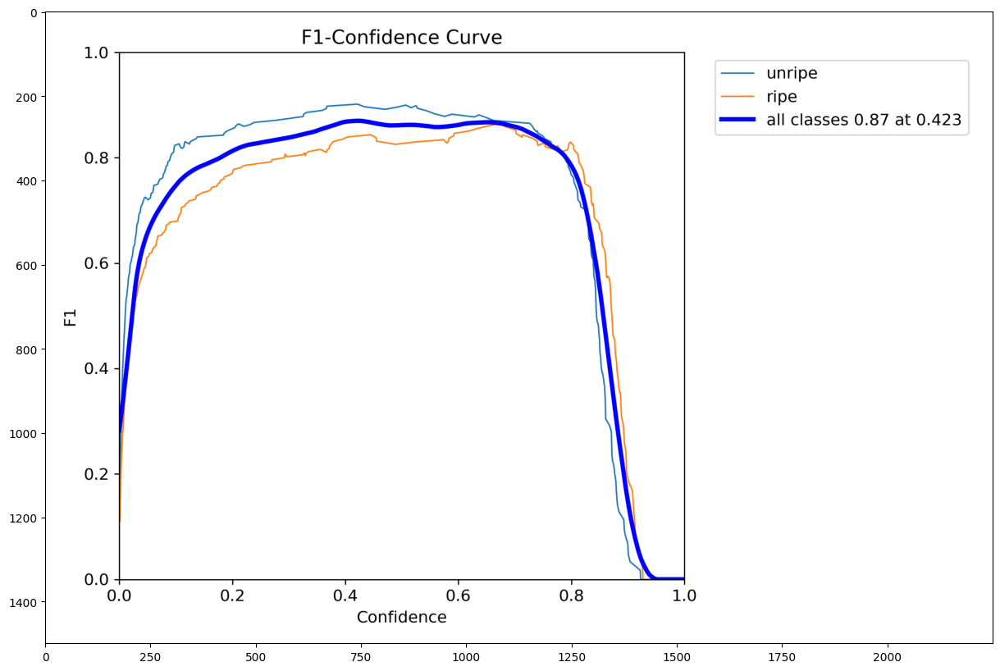

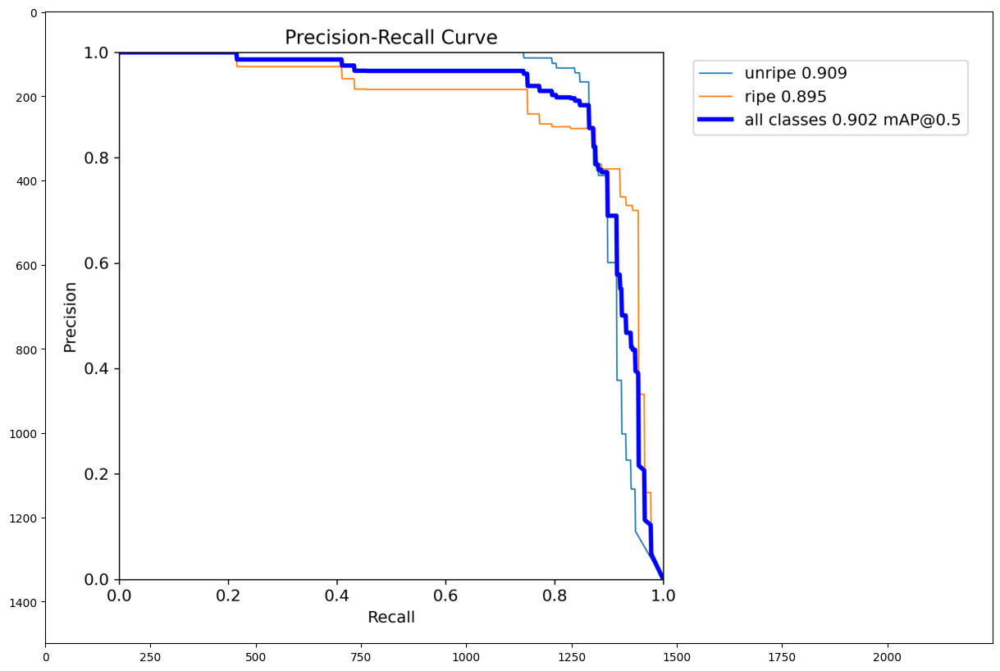

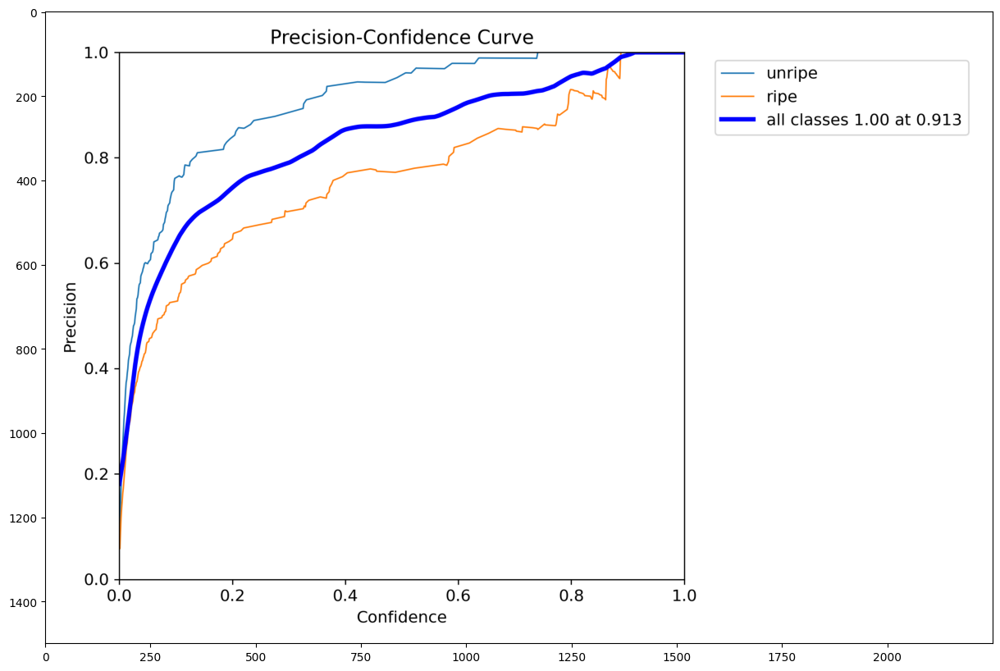

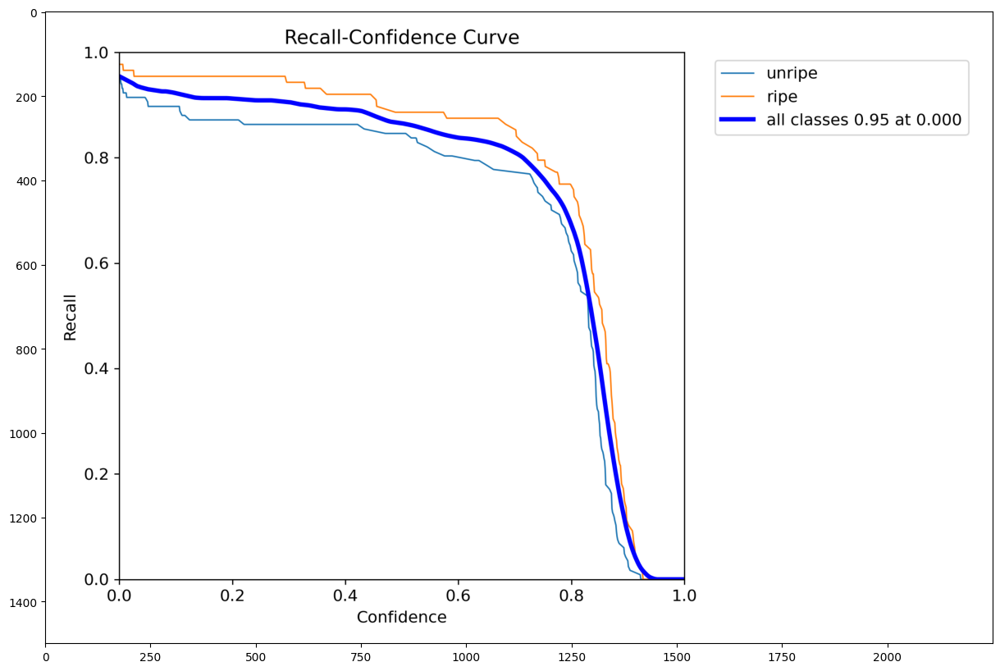

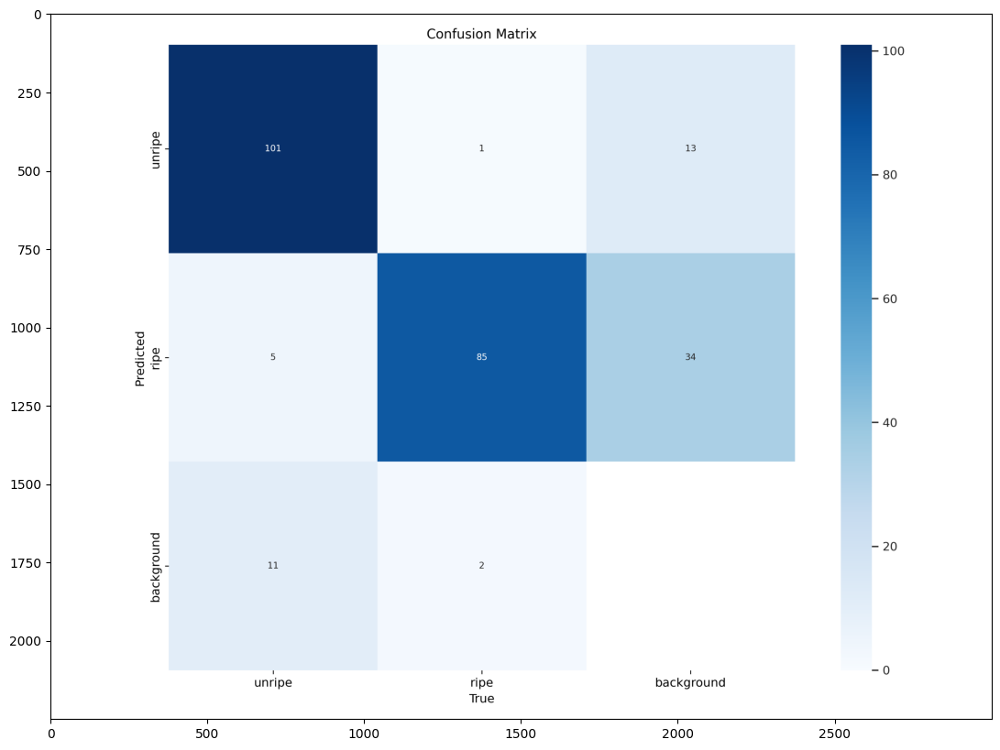

...

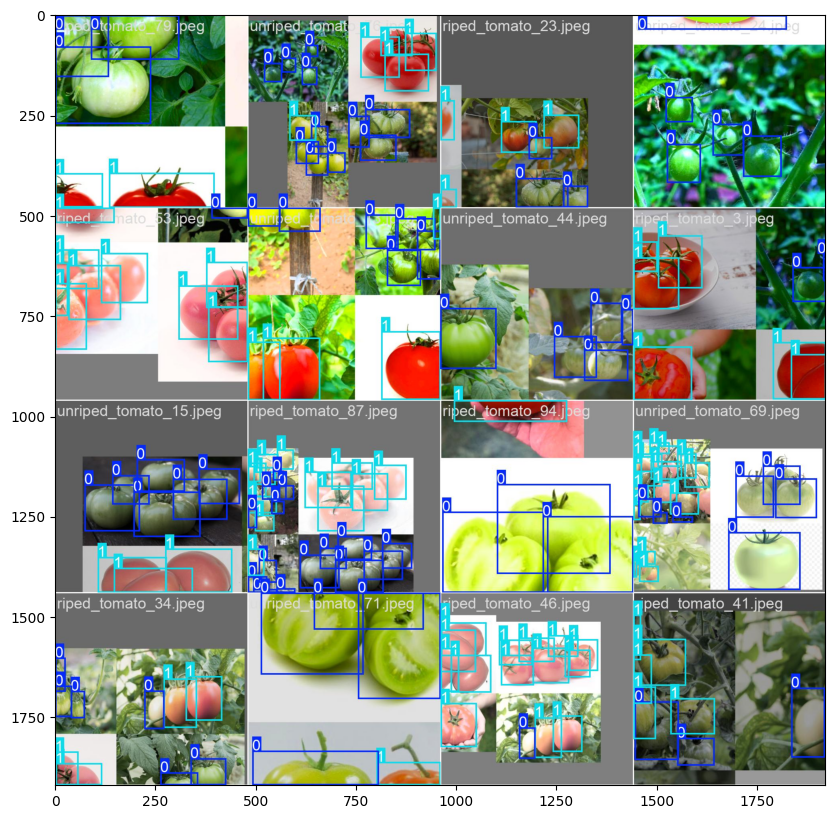

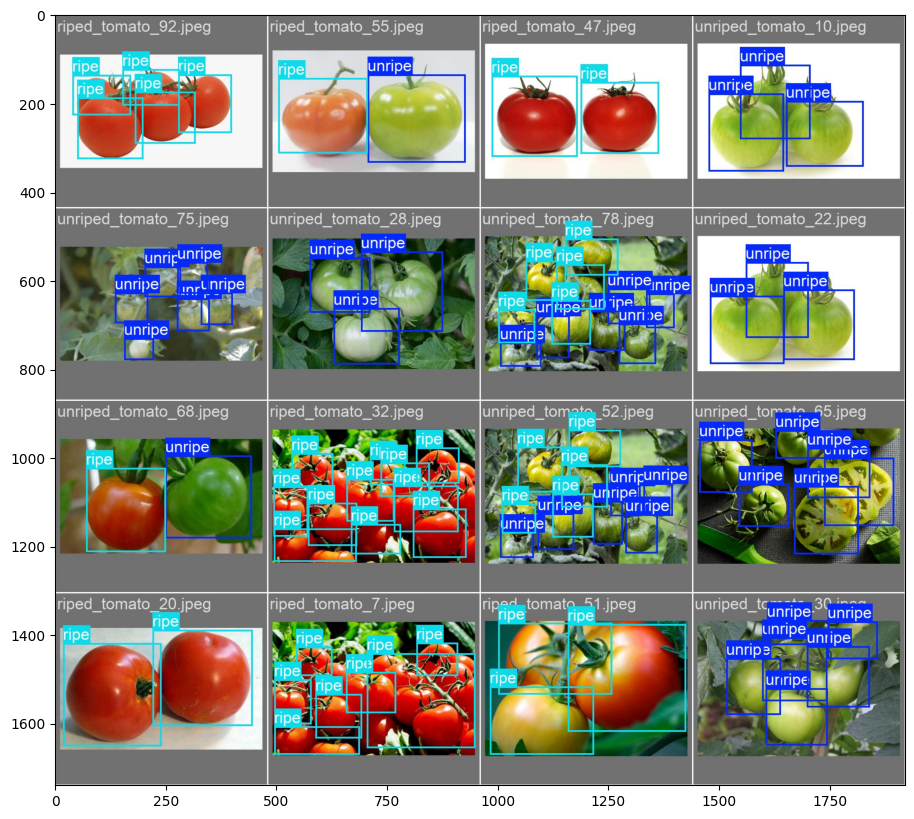

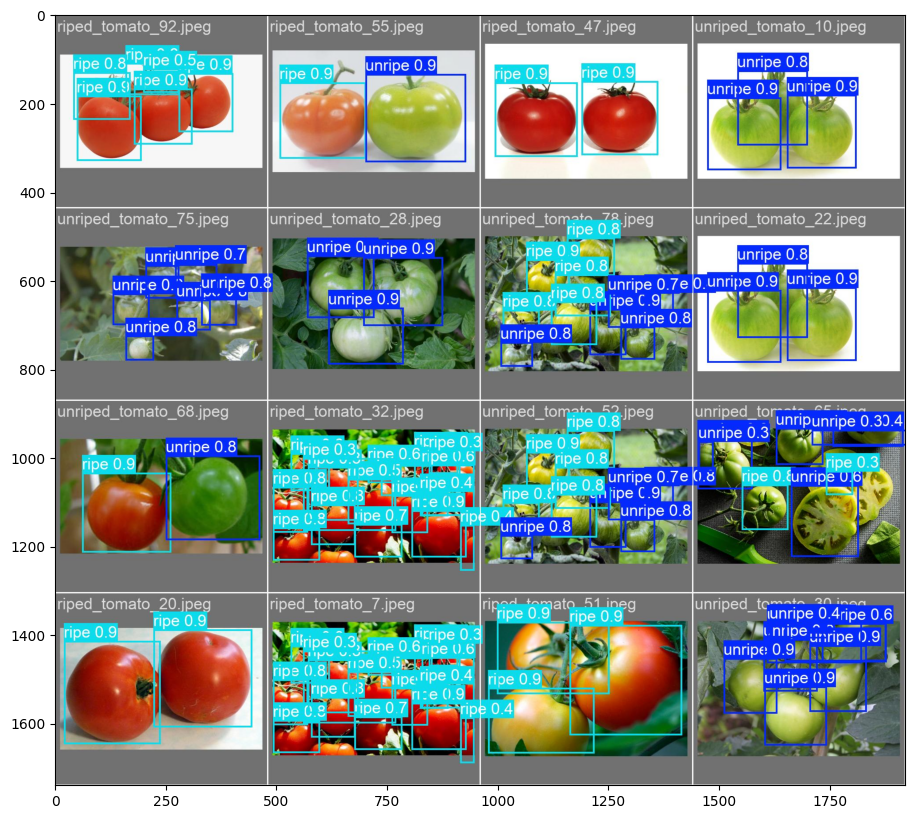

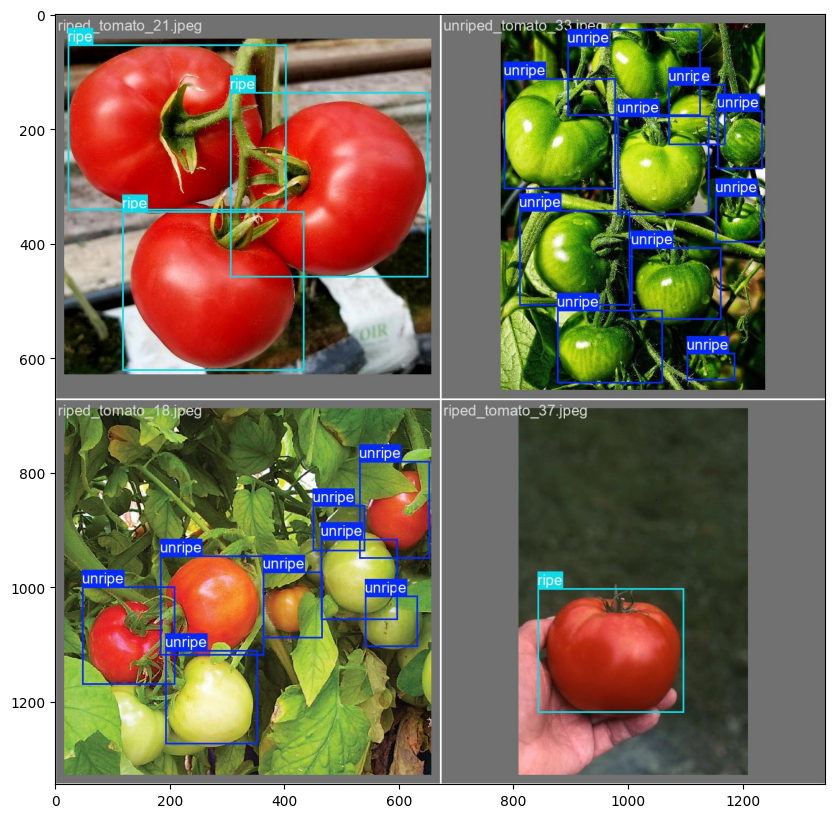

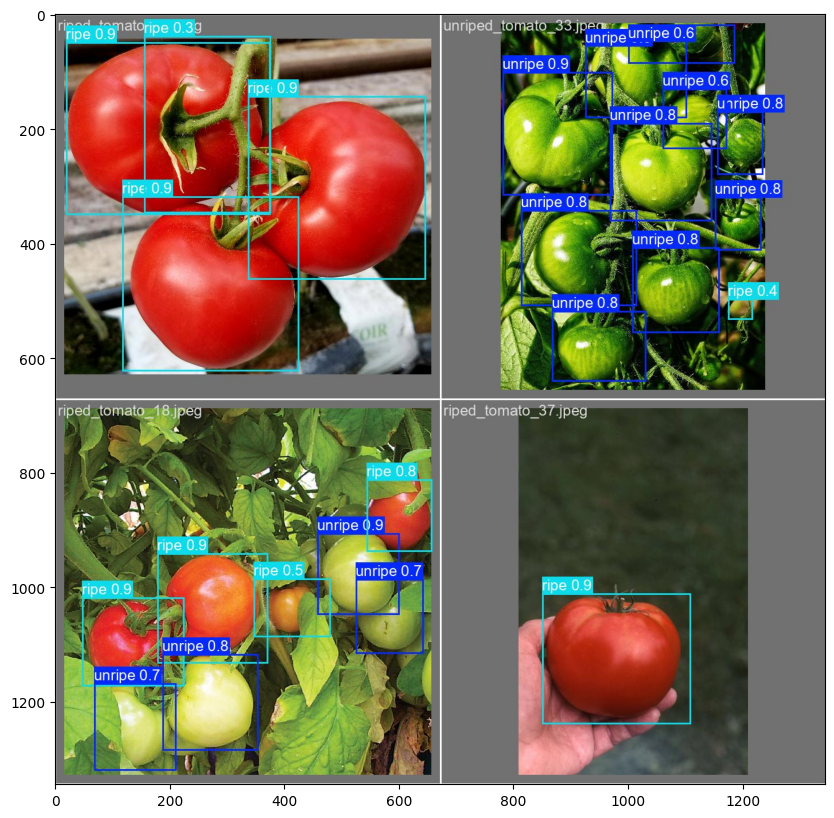

In [30]:
for path in tpaths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

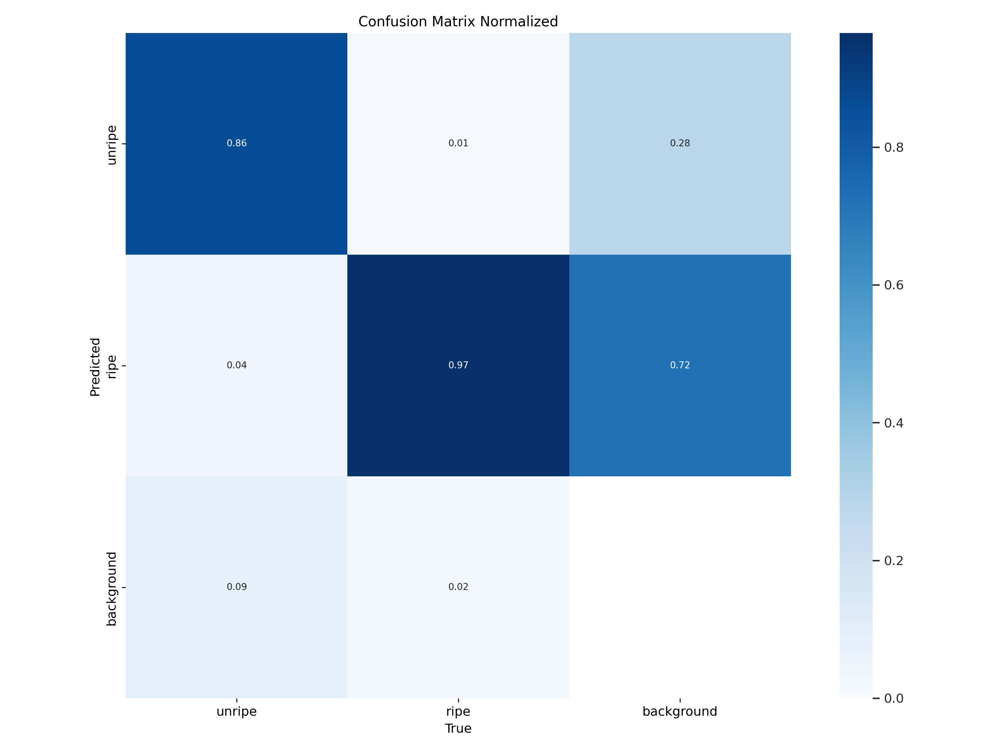

In [31]:
from IPython.display import Image

Image(filename=f'/content/drive/MyDrive/tomatodata/working/runs/detect/train4/confusion_matrix_normalized.png', width=1000)

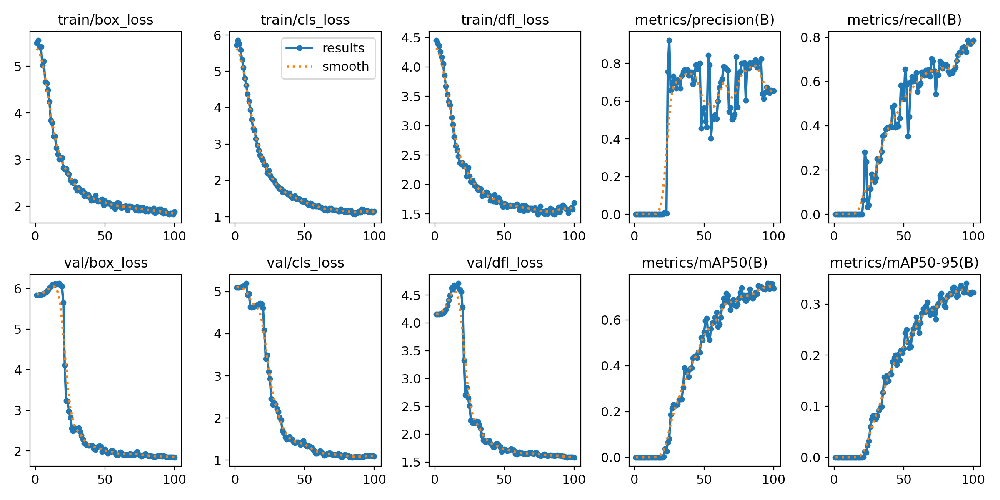

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

In [32]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"/content/drive/MyDrive/tomatodata/working/test/images",
    annotations_directory_path=f"/content/drive/MyDrive/tomatodata/working/test/labels",
    data_yaml_path=f"/content/drive/MyDrive/tomatodata/working/dataset.yaml"
)

ds.classes

['unripe', 'ripe']

In [33]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/content/drive/MyDrive/tomatodata/working/runs/detect/train4/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [34]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

mAP 50:95 0.5465982760600564
mAP 50 0.8542960232506944
mAP 75 0.6457831947475533


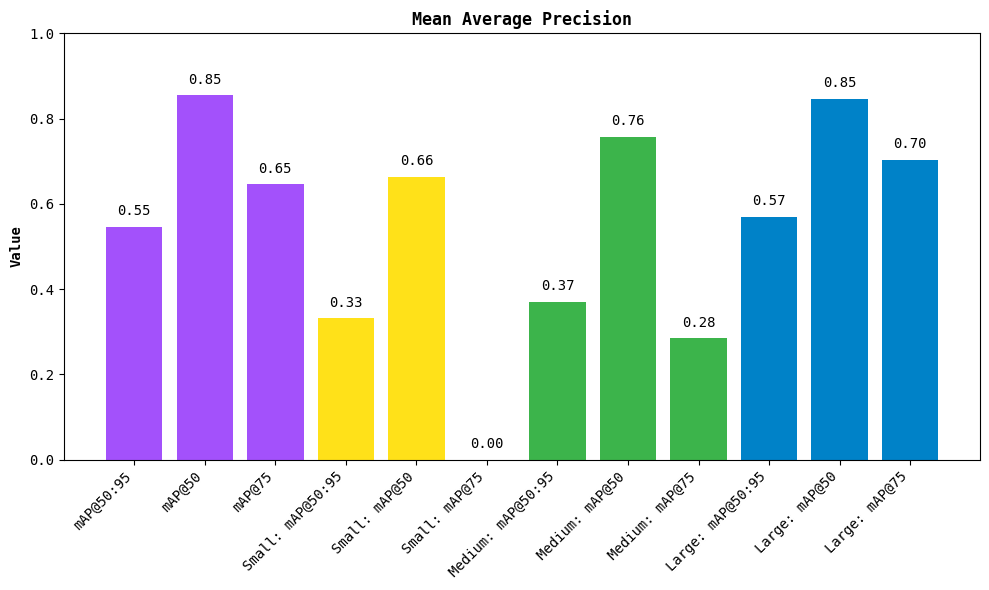

In [35]:
map.plot()

## Run inference with fine-tuned YOLOv12 model

In [36]:
import supervision as sv

model = YOLO(f'/content/drive/MyDrive/tomatodata/working/runs/detect/train4/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"/content/drive/MyDrive/tomatodata/working/test/images",
    annotations_directory_path=f"/content/drive/MyDrive/tomatodata/working/test/labels",
    data_yaml_path=f"/content/drive/MyDrive/tomatodata/working/dataset.yaml"
)

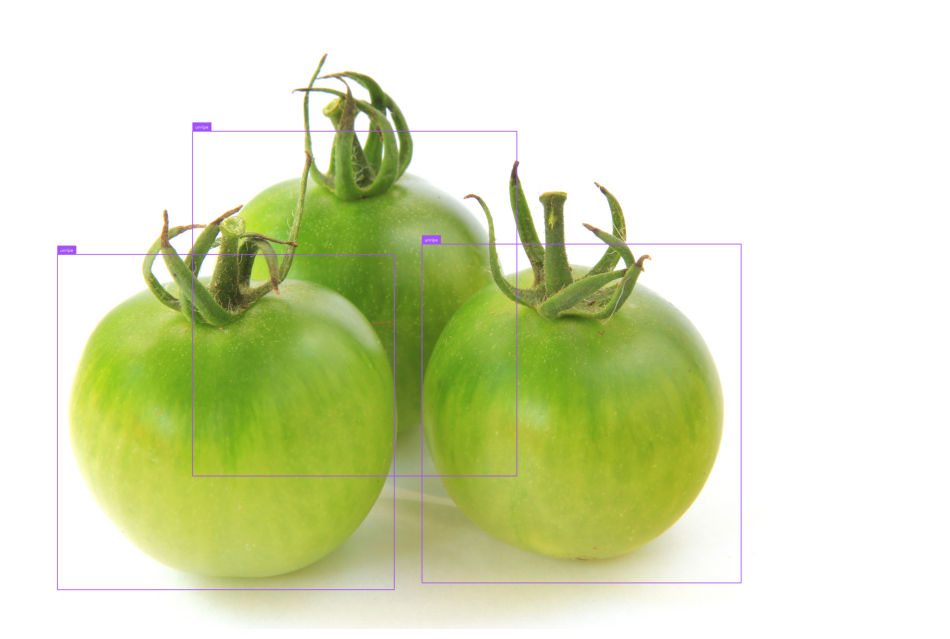

In [42]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)